<a href="https://colab.research.google.com/github/RaffyJO/PCVK_Ganjil_2024/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama : Raffy Jamil Octavialdy
<br>
Kelas : TI - 3D
<br>
NIM : 2241720082

# Object Detection

Metode yang digunakan:
1. Template Matching
2. Edge Detection
3. Corner Detection
4. Grid Detection
5. Contour Detection

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Template Matching

Menggunakan library OpenCV:
***cv.matchTemplate()***, dengan parameter
- ***image***: citra input
- ***templ***: template yang dicari, ukurannya tidak boleh lebih besar dari citra input
- ***method***: metode dari template matching

Jenis metode template matching di OpenCV:
1. cv.TM_SQDIFF
2. cv.TM_SQDIFF_NORMED
3. cv.TM_CCORR
4. cv.TM_CCORR_NORMED
5. cv.TM_CCOEFF
6. cv.TM_CCOEFF_NORMED

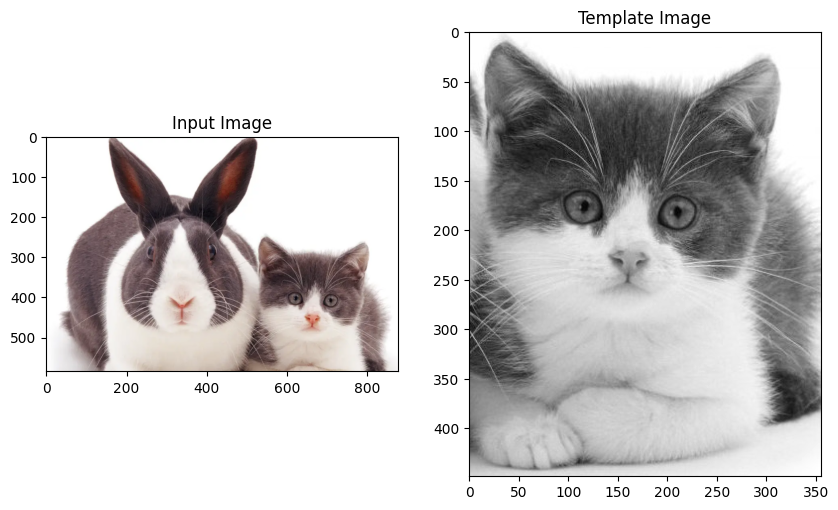

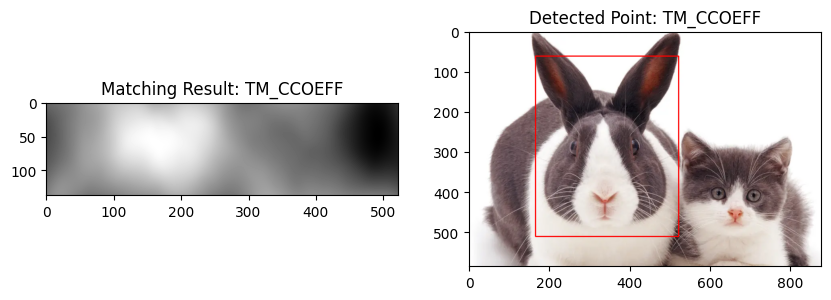

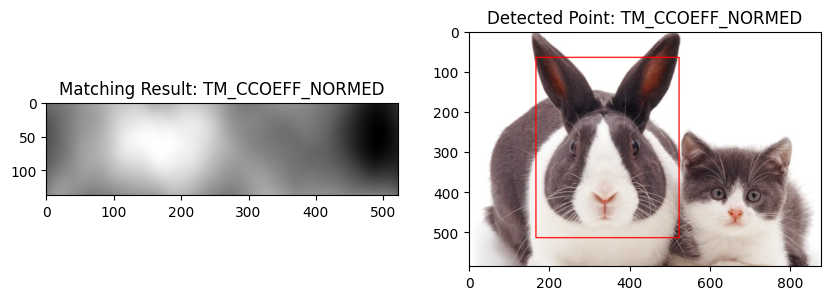

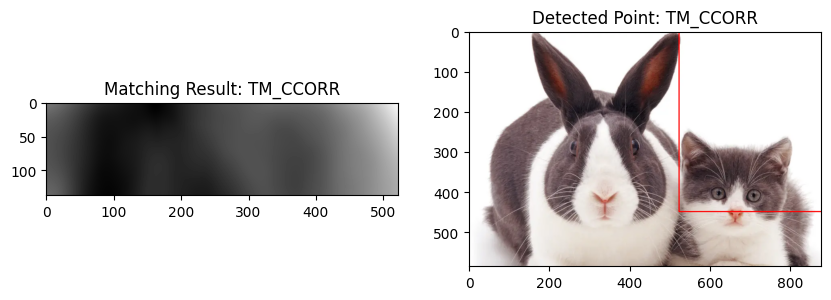

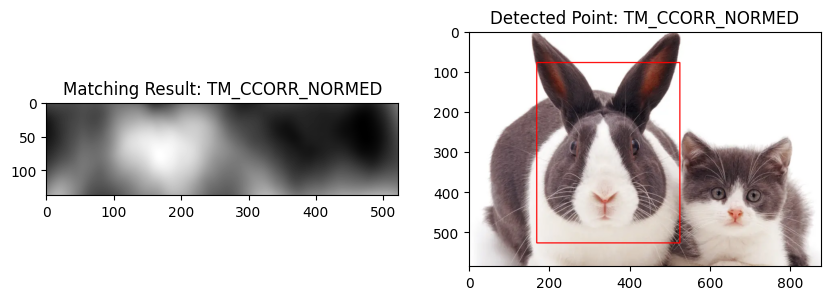

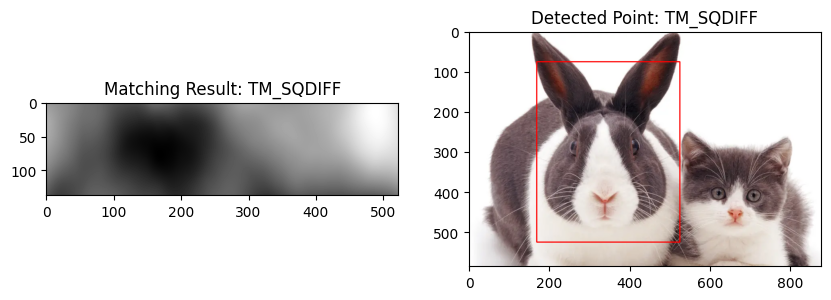

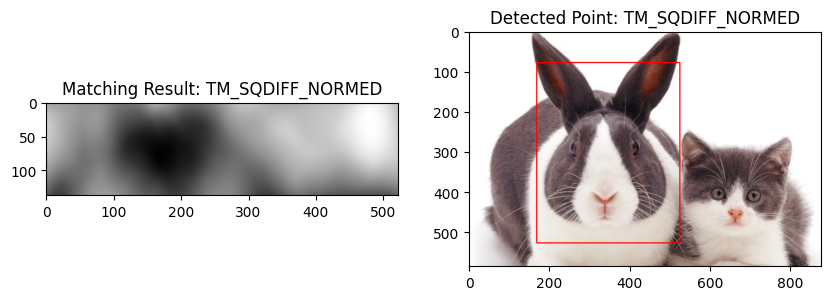

In [3]:
# 2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path untuk input image dan template image
input_image_path = ('/content/drive/MyDrive/PCVK/Images/cats_and_bunnies.jpg')
template_image_path = ('/content/drive/MyDrive/PCVK/Images/cat2_template.jpg')

# Load gambar input dan template dalam format grayscale untuk proses matching, dan RGB untuk hasil akhir
input_image_gray = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
template_image = cv2.imread(template_image_path, cv2.IMREAD_GRAYSCALE)
input_image_rgb = cv2.imread(input_image_path)  # Untuk hasil akhir dalam RGB
template_height, template_width = template_image.shape[:2]

# Tampilkan input image dan template pada baris pertama
plt.figure(figsize=(10, 8))

plt.subplot(1, 2, 1)
plt.title("Input Image")
plt.imshow(input_image_rgb[..., ::-1])  # Konversi BGR ke RGB untuk matplotlib

plt.subplot(1, 2, 2)
plt.title("Template Image")
plt.imshow(template_image, cmap='gray')

plt.show()

# Metode matching yang akan digunakan
methods = [
    ('TM_CCOEFF', cv2.TM_CCOEFF),
    ('TM_CCOEFF_NORMED', cv2.TM_CCOEFF_NORMED),
    ('TM_CCORR', cv2.TM_CCORR),
    ('TM_CCORR_NORMED', cv2.TM_CCORR_NORMED),
    ('TM_SQDIFF', cv2.TM_SQDIFF),
    ('TM_SQDIFF_NORMED', cv2.TM_SQDIFF_NORMED)
]

# Fungsi untuk menampilkan hasil matching
def plot_matching_results(method_name, result, detected_point):
    plt.figure(figsize=(10, 4))

    # Matching Result
    plt.subplot(1, 2, 1)
    plt.title(f'Matching Result: {method_name}')
    plt.imshow(result, cmap='gray')

    # Detected Point dengan warna merah pada RGB image
    plt.subplot(1, 2, 2)
    plt.title(f'Detected Point: {method_name}')
    display_image = input_image_rgb.copy()
    top_left = detected_point
    bottom_right = (top_left[0] + template_width, top_left[1] + template_height)
    cv2.rectangle(display_image, top_left, bottom_right, (0, 0, 255), 2)  # Warna merah dalam RGB
    plt.imshow(display_image[..., ::-1])  # Konversi BGR ke RGB untuk matplotlib
    plt.show()

# Proses matching untuk setiap metode
for method_name, method in methods:
    result = cv2.matchTemplate(input_image_gray, template_image, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        detected_point = min_loc
    else:
        detected_point = max_loc
    plot_matching_results(method_name, result, detected_point)

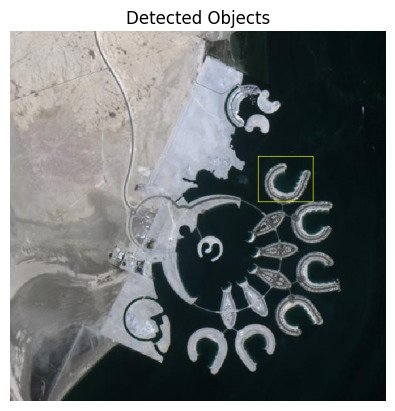

In [4]:
# 3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import gaussian_filter

# Fungsi untuk menghitung Normalized Cross-Correlation
def normalized_cross_correlation(img, template):
    img_height, img_width, _ = img.shape
    template_height, template_width, _ = template.shape
    result = np.zeros((img_height - template_height + 1, img_width - template_width + 1))

    # Hitung rata-rata dan deviasi standar dari template
    template_mean = np.mean(template)
    template_std = np.std(template)

    for y in range(result.shape[0]):
        for x in range(result.shape[1]):
            # Ambil bagian dari gambar dengan ukuran template
            patch = img[y:y + template_height, x:x + template_width]
            patch_mean = np.mean(patch)
            patch_std = np.std(patch)

            # Hitung Normalized Cross-Correlation
            if template_std > 0 and patch_std > 0:
                ncc = np.sum((patch - patch_mean) * (template - template_mean)) / (template_std * patch_std * template.size)
                result[y, x] = ncc
            else:
                result[y, x] = 0

    return result

# Fungsi untuk menampilkan gambar dengan kotak deteksi
def plot_detections(img, detections, template_shape):
    img_with_boxes = img.copy()
    template_height, template_width, _ = template_shape

    for (y, x) in detections:
        top_left = (x, y)
        bottom_right = (x + template_width, y + template_height)
        img_with_boxes = draw_rectangle(img_with_boxes, top_left, bottom_right, color=(255, 255, 0))  # Warna kuning

    plt.imshow(img_with_boxes)
    plt.axis('off')
    plt.title('Detected Objects')
    plt.show()

# Fungsi untuk menggambar kotak pada gambar
def draw_rectangle(image, top_left, bottom_right, color):
    image_with_rectangle = image.copy()
    image_with_rectangle[top_left[1]:bottom_right[1], top_left[0], :] = color  # Garis kiri
    image_with_rectangle[top_left[1]:bottom_right[1], bottom_right[0]-1, :] = color  # Garis kanan
    image_with_rectangle[top_left[1], top_left[0]:bottom_right[0], :] = color  # Garis atas
    image_with_rectangle[bottom_right[1]-1, top_left[0]:bottom_right[0], :] = color  # Garis bawah
    return image_with_rectangle

# Fungsi untuk menghapus deteksi yang tumpang tindih
def suppress_overlapping_detections(detections, overlap_threshold=0.5):
    if len(detections) == 0:
        return []

    # Sort detections berdasarkan y, x
    detections = sorted(detections, key=lambda x: (x[0], x[1]))
    suppressed = []

    while detections:
        # Ambil deteksi pertama
        current = detections.pop(0)
        suppressed.append(current)

        # Hitung area deteksi
        current_y, current_x = current
        current_area = (current_x, current_y, current_x + template_image.shape[1], current_y + template_image.shape[0])

        # Hapus deteksi yang tumpang tindih
        detections = [d for d in detections if not is_overlapping(current_area, d, overlap_threshold)]

    return suppressed

# Fungsi untuk memeriksa tumpang tindih
def is_overlapping(current_area, detection, threshold):
    detection_y, detection_x = detection
    detection_area = (detection_x, detection_y, detection_x + template_image.shape[1], detection_y + template_image.shape[0])

    # Hitung area overlap
    x_overlap = max(0, min(current_area[2], detection_area[2]) - max(current_area[0], detection_area[0]))
    y_overlap = max(0, min(current_area[3], detection_area[3]) - max(current_area[1], detection_area[1]))
    overlap_area = x_overlap * y_overlap

    # Hitung area dari masing-masing deteksi
    current_area_size = (current_area[2] - current_area[0]) * (current_area[3] - current_area[1])
    detection_area_size = (detection_area[2] - detection_area[0]) * (detection_area[3] - detection_area[1])

    # Hitung proporsi tumpang tindih
    if current_area_size > 0 and detection_area_size > 0:
        overlap_ratio = overlap_area / float(current_area_size + detection_area_size - overlap_area)
        return overlap_ratio > threshold

    return False

# Load gambar input dan template
input_image_path = '/content/drive/MyDrive/PCVK/Images/bahrain.jpg'
template_image_path = '/content/drive/MyDrive/PCVK/Images/bahrain-template.jpg'

input_image = np.array(Image.open(input_image_path))
template_image = np.array(Image.open(template_image_path))

# Terapkan Gaussian Blur pada template
template_image = gaussian_filter(template_image, sigma=1)

# Hitung Normalized Cross-Correlation
ncc_result = normalized_cross_correlation(input_image, template_image)

# Threshold untuk mendeteksi objek
threshold = 0.6  # Turunkan threshold agar lebih toleran
detected_points = np.argwhere(ncc_result >= threshold)

# Hapus deteksi yang tumpang tindih
detected_points = suppress_overlapping_detections(detected_points.tolist(), overlap_threshold=0.3)

# Tampilkan gambar dengan deteksi
plot_detections(input_image, detected_points, template_image.shape)

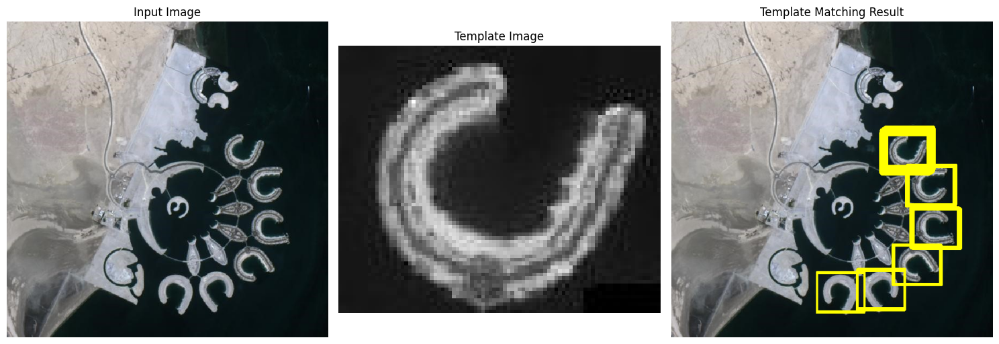

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('/content/drive/MyDrive/PCVK/Images/bahrain.jpg', cv.COLOR_BGR2GRAY)

img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Membaca template gambar dalam format grayscale
template = cv.imread('/content/drive/MyDrive/PCVK/Images/bahrain-template.jpg', cv.IMREAD_GRAYSCALE)

# Mendapatkan lebar dan tinggi template
w, h = template.shape[::-1]

# Melakukan pencocokan template menggunakan metode TM_CCOEFF_NORMED
res = cv.matchTemplate(img_gray, template, cv.TM_CCOEFF_NORMED)

# Menetapkan threshold untuk menentukan kesesuaian pencocokan
threshold = 0.43

# Menemukan lokasi pada gambar yang sesuai dengan threshold
loc = np.where(res >= threshold)

# Menyalin gambar asli untuk menggambar persegi panjang hasil pencocokan
img_with_rectangle = img.copy()
for pt in zip(*loc[::-1]):
    cv.rectangle(img_with_rectangle, pt, (pt[0] + w, pt[1] + h), (0, 255, 255), 1)  # Menggambar persegi panjang warna kuning

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axs[0].set_title('Input Image')
axs[0].axis('off')

axs[1].imshow(template, cmap='gray')
axs[1].set_title('Template Image')
axs[1].axis('off')

axs[2].imshow(cv.cvtColor(img_with_rectangle, cv.COLOR_BGR2RGB))
axs[2].set_title('Template Matching Result')
axs[2].axis('off')

plt.tight_layout()
plt.show()

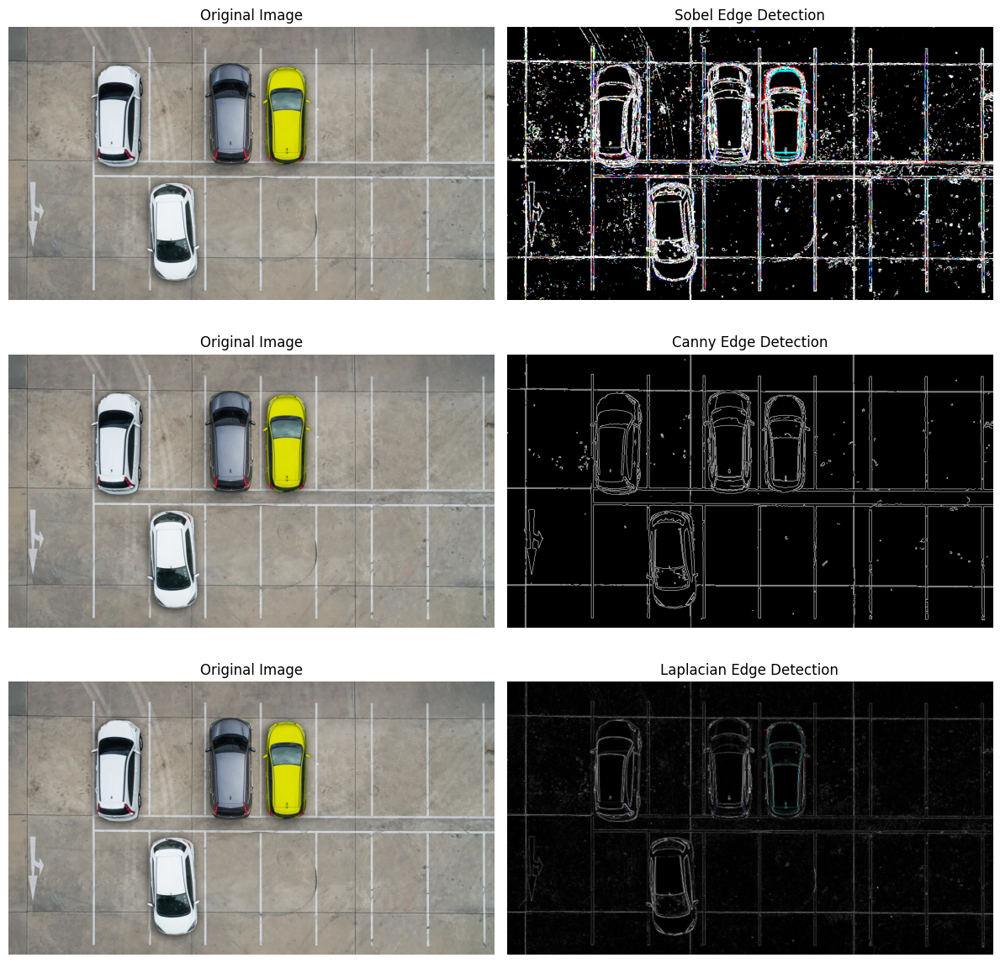

In [6]:
# 4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = '/content/drive/MyDrive/PCVK/Images/car-park.jpg'
image = cv2.imread(image_path)

# Convert to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Sobel Edge Detection
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Derivative in x direction
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Derivative in y direction
sobel_edges = cv2.magnitude(sobel_x, sobel_y)  # Combine both directions
sobel_edges = np.uint8(sobel_edges)  # Convert to uint8

# Apply thresholding to reduce noise in Sobel edges
_, sobel_edges_thresholded = cv2.threshold(sobel_edges, 50, 255, cv2.THRESH_BINARY)

# Canny Edge Detection
canny_edges = cv2.Canny(image, 100, 200)  # Thresholds can be adjusted

# Laplacian Edge Detection
laplacian_edges = cv2.Laplacian(image, cv2.CV_64F)
laplacian_edges = np.uint8(np.absolute(laplacian_edges))  # Convert to uint8

# Plot results
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Sobel
axs[0, 0].imshow(image_rgb)
axs[0, 0].axis('off')
axs[0, 0].set_title('Original Image')

axs[0, 1].imshow(sobel_edges_thresholded, cmap='gray')
axs[0, 1].axis('off')
axs[0, 1].set_title('Sobel Edge Detection')

# Canny
axs[1, 0].imshow(image_rgb)
axs[1, 0].axis('off')
axs[1, 0].set_title('Original Image')

axs[1, 1].imshow(canny_edges, cmap='gray')
axs[1, 1].axis('off')
axs[1, 1].set_title('Canny Edge Detection')

# Laplacian
axs[2, 0].imshow(image_rgb)
axs[2, 0].axis('off')
axs[2, 0].set_title('Original Image')

axs[2, 1].imshow(laplacian_edges, cmap='gray')
axs[2, 1].axis('off')
axs[2, 1].set_title('Laplacian Edge Detection')

plt.tight_layout()
plt.show()

<ipython-input-7-7ee114a70354>:27: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  shi_tomasi_corners = np.int0(shi_tomasi_corners)


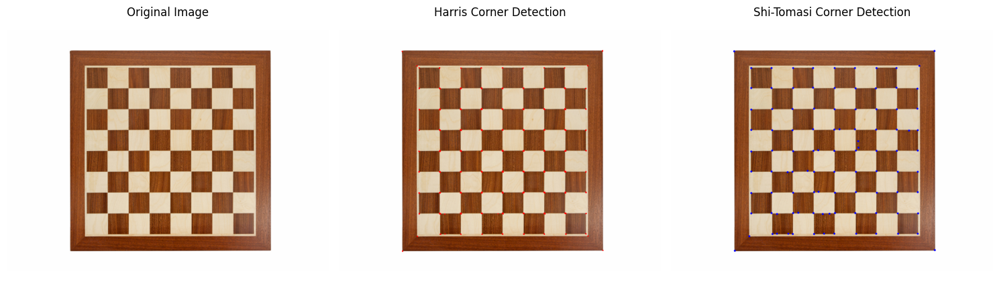

In [7]:
# 5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chess-board.jpg

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = '/content/drive/MyDrive/PCVK/Images/chess-board.jpg'
image = cv2.imread(image_path)

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Harris Corner Detection
harris_corners = cv2.cornerHarris(gray_image, blockSize=2, ksize=3, k=0.04)
# Dilate to mark the corners
harris_corners = cv2.dilate(harris_corners, None)
# Thresholding to identify strong corners
threshold = 0.01 * harris_corners.max()
image_harris = image.copy()
image_harris[harris_corners > threshold] = [0, 0, 255]  # Mark corners in red

# Shi-Tomasi Corner Detection
shi_tomasi_corners = cv2.goodFeaturesToTrack(gray_image, maxCorners=100, qualityLevel=0.01, minDistance=10)
image_shi_tomasi = image.copy()
if shi_tomasi_corners is not None:
    shi_tomasi_corners = np.int0(shi_tomasi_corners)
    for corner in shi_tomasi_corners:
        x, y = corner.ravel()
        cv2.circle(image_shi_tomasi, (x, y), 3, (255, 0, 0), -1)  # Mark corners in blue

# Plot results
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Original image
axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[0].set_title('Original Image')

# Harris Corners
axs[1].imshow(cv2.cvtColor(image_harris, cv2.COLOR_BGR2RGB))
axs[1].axis('off')
axs[1].set_title('Harris Corner Detection')

# Shi-Tomasi Corners
axs[2].imshow(cv2.cvtColor(image_shi_tomasi, cv2.COLOR_BGR2RGB))
axs[2].axis('off')
axs[2].set_title('Shi-Tomasi Corner Detection')

plt.tight_layout()
plt.show()

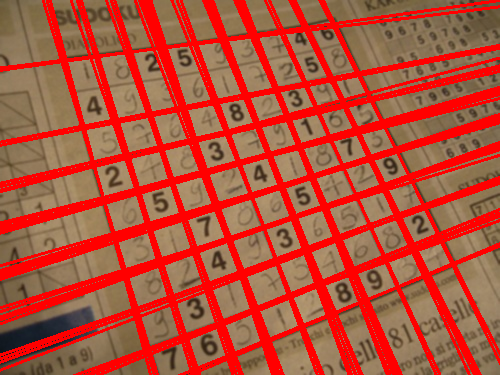

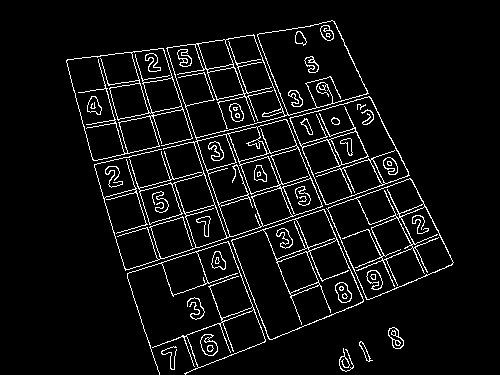

In [8]:
# 6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca gambar Sudoku
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/sudoku.jpg')
# Mengonversi gambar ke grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Menerapkan Gaussian Blur untuk mengurangi noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Mendeteksi tepi menggunakan Canny
# Coba ubah ambang batas di sini jika perlu
edges = cv2.Canny(blurred, 50, 200)

# Menerapkan Hough Transform untuk mendeteksi garis
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=100)  # Ubah threshold jika perlu

# Menggambar garis yang terdeteksi pada gambar asli
if lines is not None:
    for rho, theta in lines[:, 0]:
        # Menghitung titik garis berdasarkan rho dan theta
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        # Menggambar garis
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Menampilkan gambar hasil dengan garis
cv2_imshow(img)

# (Optional) Tampilkan gambar tepi untuk debugging
cv2_imshow(edges)

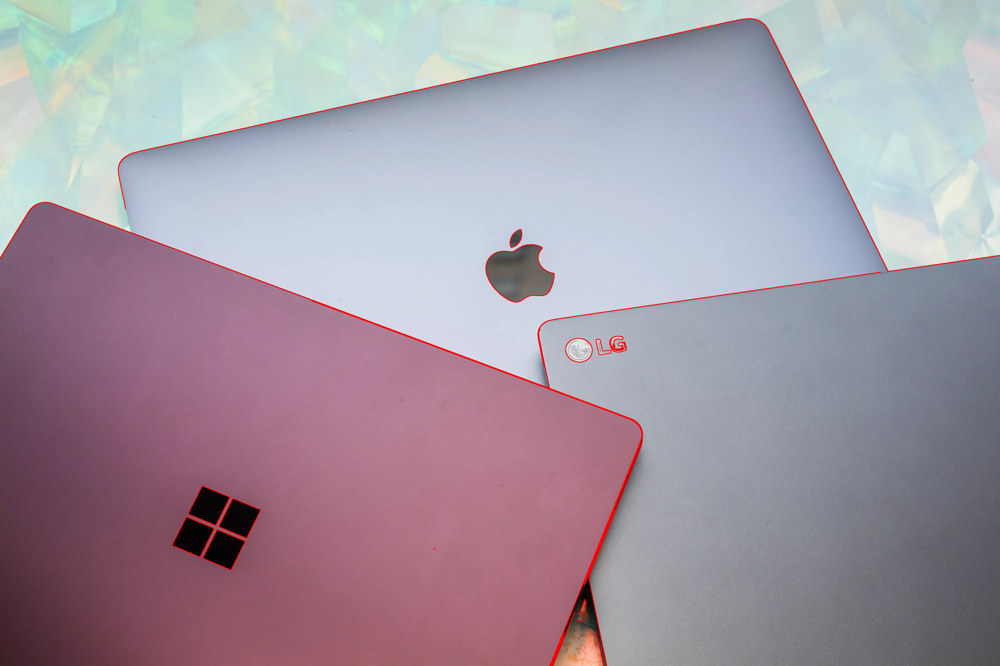

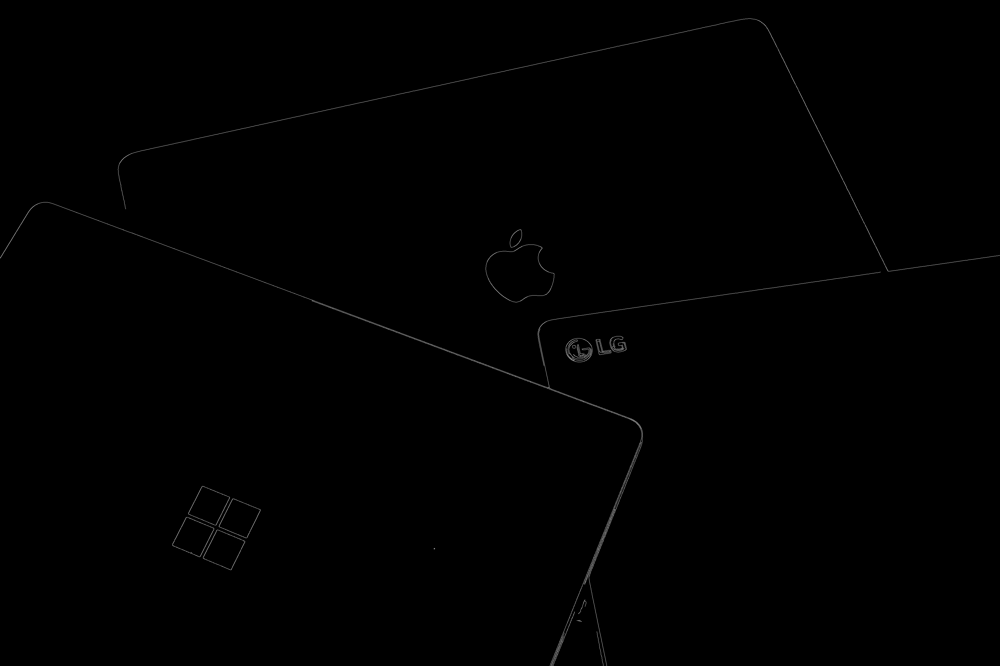

In [9]:
# 7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca gambar
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/laptop.jpg')
# Mengonversi gambar ke grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Menerapkan Gaussian Blur untuk mengurangi noise sebelum deteksi tepi
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Tahap 1: Mengubah citra input menjadi citra biner menggunakan deteksi tepi Canny
edges = cv2.Canny(blurred, 50, 150)  # Parameter bisa disesuaikan untuk meningkatkan akurasi

# Tahap 2: Menemukan kontur menggunakan fungsi findContours()
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Tahap 3: Menggambarkan kontur pada citra input menggunakan fungsi drawContours()
# Menggambar kontur pada gambar asli
cv2.drawContours(img, contours, -1, (0, 0, 255), 2)  # Menggambar kontur dengan warna hijau

# Menampilkan gambar hasil
cv2_imshow(img)

# (Optional) Menampilkan gambar deteksi tepi untuk debugging
cv2_imshow(edges)

In [10]:
!jupyter nbconvert --to html /content/Week11.ipynb

[NbConvertApp] Converting notebook /content/Week11.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 15 image(s).
[NbConvertApp] Writing 10327722 bytes to /content/Week11.html
